# imports

In [2]:
from sotip import *
import numpy as np
import scanpy as sc
import squidpy as sq


### cell data

In [3]:
adata = sq.datasets.four_i()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
adata

AnnData object with n_obs × n_vars = 270876 × 43
    obs: 'x', 'y', 'is_nucleous', 'is_cytplasm', 'cell_id', 'leiden', 'cluster'
    uns: 'cluster_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# test

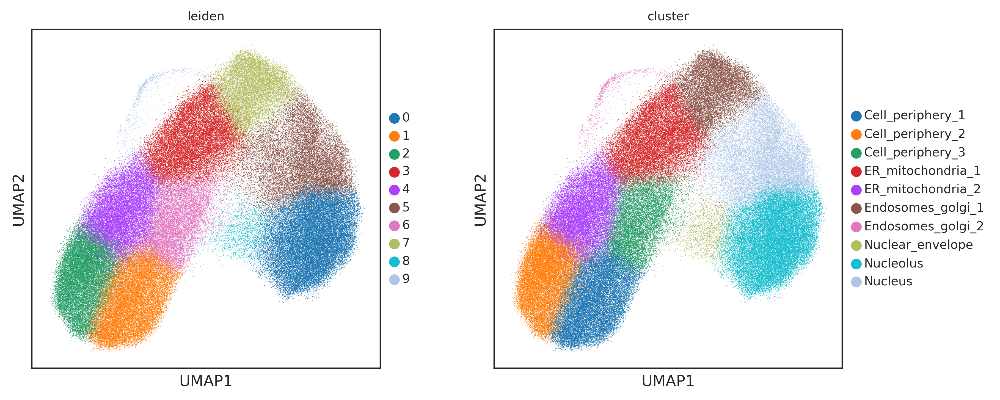

In [5]:
# without normalization and log
sc.pl.umap(adata,color=['leiden','cluster'])

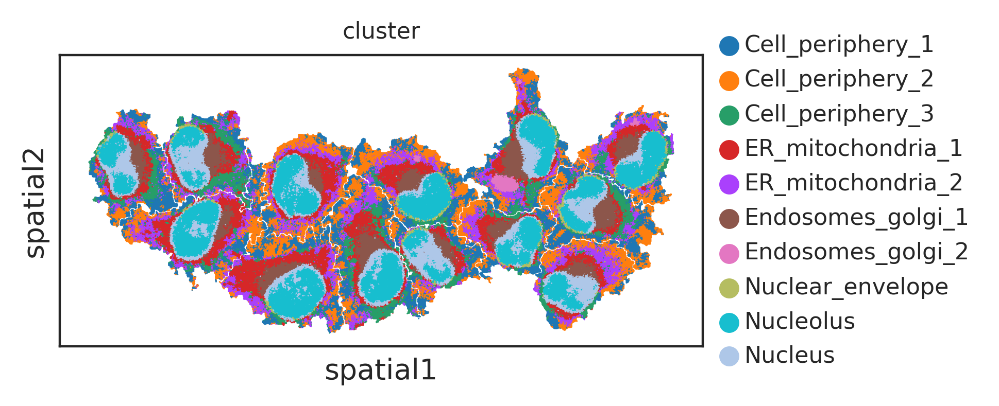

In [6]:
sc.pl.embedding(adata,basis='spatial',color=['cluster'],show=False,size=1,marker='.')
plt.gca().set_aspect('equal', adjustable='box') 


In [24]:
adata.obs['is_nucleous']=adata.obs['is_nucleous'].astype('str')
adata.obs['is_cytplasm']=adata.obs['is_cytplasm'].astype('str')

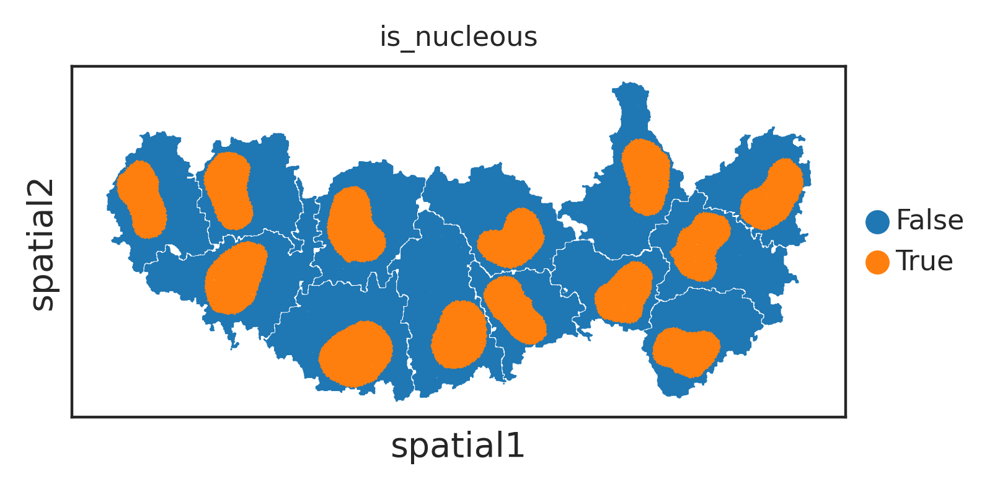

In [8]:
sc.pl.embedding(adata,basis='spatial',color=['is_nucleous'],show=False,size=1,marker='.')
plt.gca().set_aspect('equal', adjustable='box') 


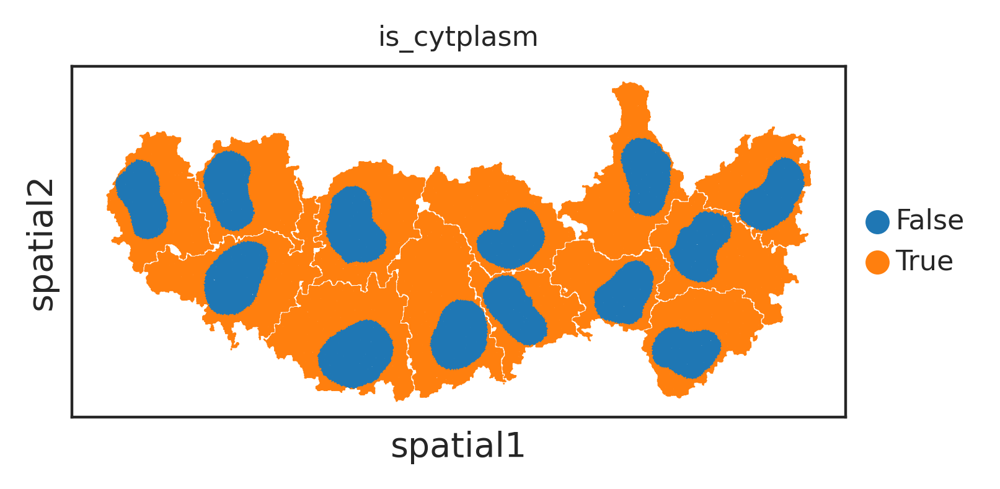

In [9]:
sc.pl.embedding(adata,basis='spatial',color=['is_cytplasm'],show=False,size=1,marker='.')
plt.gca().set_aspect('equal', adjustable='box') 


# ME

In [10]:
knn = 10
spatial_var='spatial'
cls_key='cluster'
ME_var_names_np_unique = np.unique(adata.obs[cls_key]) 

MED(adata,use_cls=cls_key,nn=knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var=spatial_var) 


knn search time cost 0.9207713603973389 s
0 MEs,time cost 3.814697265625e-06 s, 270876 MEs, 0.0010333099365234374s left
1000 MEs,time cost 0.168076753616333 s, 269876 MEs, 45.35988195896149s left
2000 MEs,time cost 0.16015911102294922 s, 268876 MEs, 43.0629411354065s left
3000 MEs,time cost 0.15964770317077637 s, 267876 MEs, 42.76578813457489s left
4000 MEs,time cost 0.13957643508911133 s, 266876 MEs, 37.249600690841675s left
5000 MEs,time cost 0.1594085693359375 s, 265876 MEs, 42.38291278076172s left
6000 MEs,time cost 0.16265654563903809 s, 264876 MEs, 43.08381518268585s left
7000 MEs,time cost 0.1355431079864502 s, 263876 MEs, 35.76657316303253s left
8000 MEs,time cost 0.15787935256958008 s, 262876 MEs, 41.502692686080934s left
9000 MEs,time cost 0.14646267890930176 s, 261876 MEs, 38.355060502052304s left
10000 MEs,time cost 0.1589343547821045 s, 260876 MEs, 41.46215873813629s left
11000 MEs,time cost 0.14821314811706543 s, 259876 MEs, 38.517040080070494s left
12000 MEs,time cost 0.

array([[7., 3., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 9.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 5., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 9., 1.],
       [0., 0., 3., ..., 0., 3., 4.]])

# CN analysis

## uniform ground distance

In [11]:
gd_method = 'uniform'
cls_key = 'cluster'
gd = get_ground_distance(adata,method=gd_method,cls_key=cls_key,embed_key=None,connect_threshold=0.1)  


In [12]:
heter_key = 'ME_heter_{0}_{1}'.format(cls_key,gd_method)

cal_ME_heterogeneity(adata,copy=False,key_added=heter_key) 

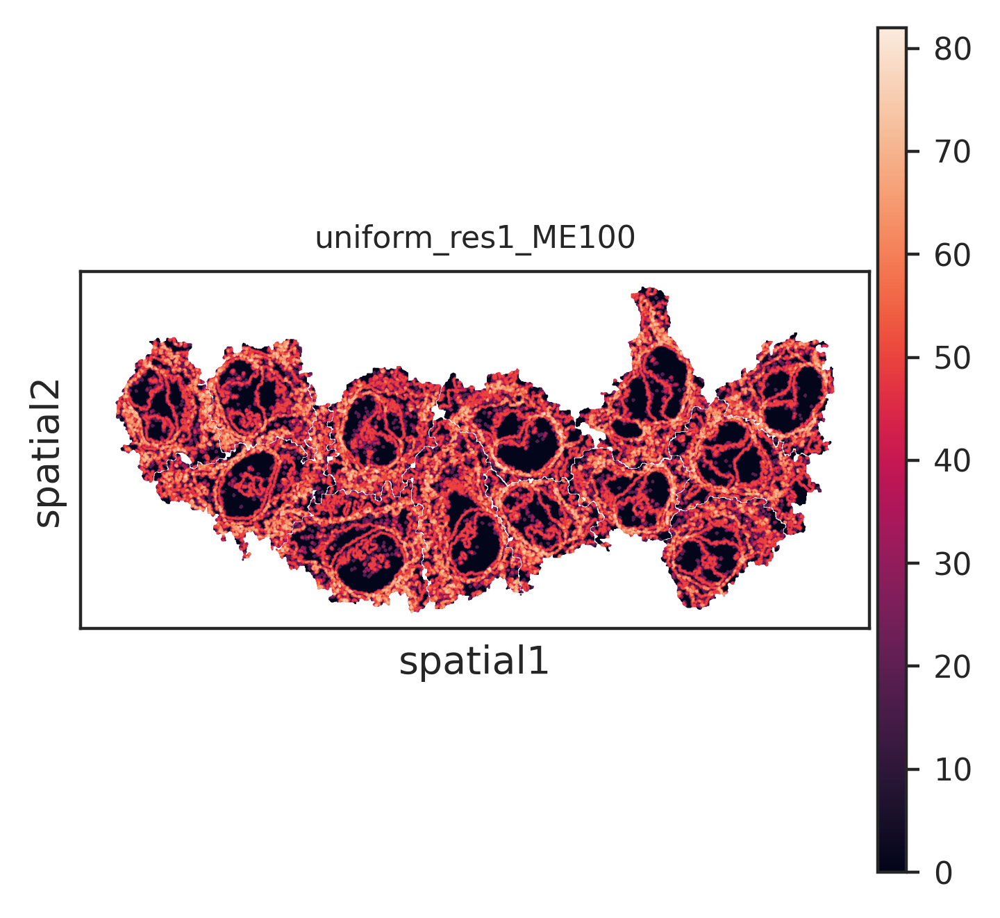

In [13]:
sc.pl.embedding(adata,basis='spatial',color=[heter_key],show=False,size=1,marker='.',title='uniform_res1_ME10')
plt.gca().set_aspect('equal', adjustable='box') 


# SOTIP analysis

## PAGAumap ground distance

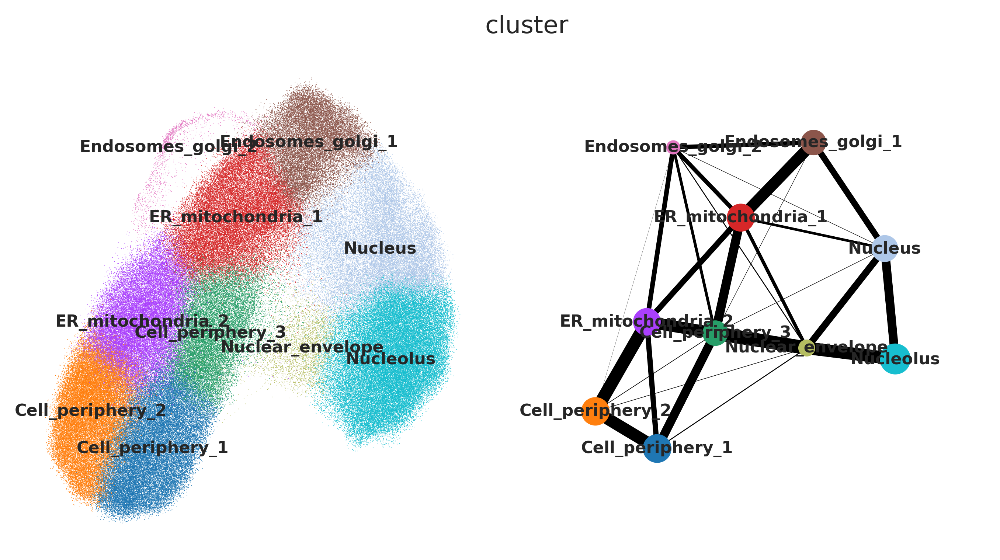

In [14]:
cls_key = 'cluster'
sc.tl.paga(adata,groups=cls_key)
sc.pl.paga_compare(adata,basis='X_umap')

In [15]:
gd_method = 'paga_guided_umap'
gd = get_ground_distance(adata,method=gd_method,cls_key=cls_key,embed_key=None,connect_threshold=0.5)  


In [16]:
heter_key = 'ME_heter_{0}_{1}'.format(cls_key,gd_method)

cal_ME_heterogeneity(adata,copy=False,key_added=heter_key) 

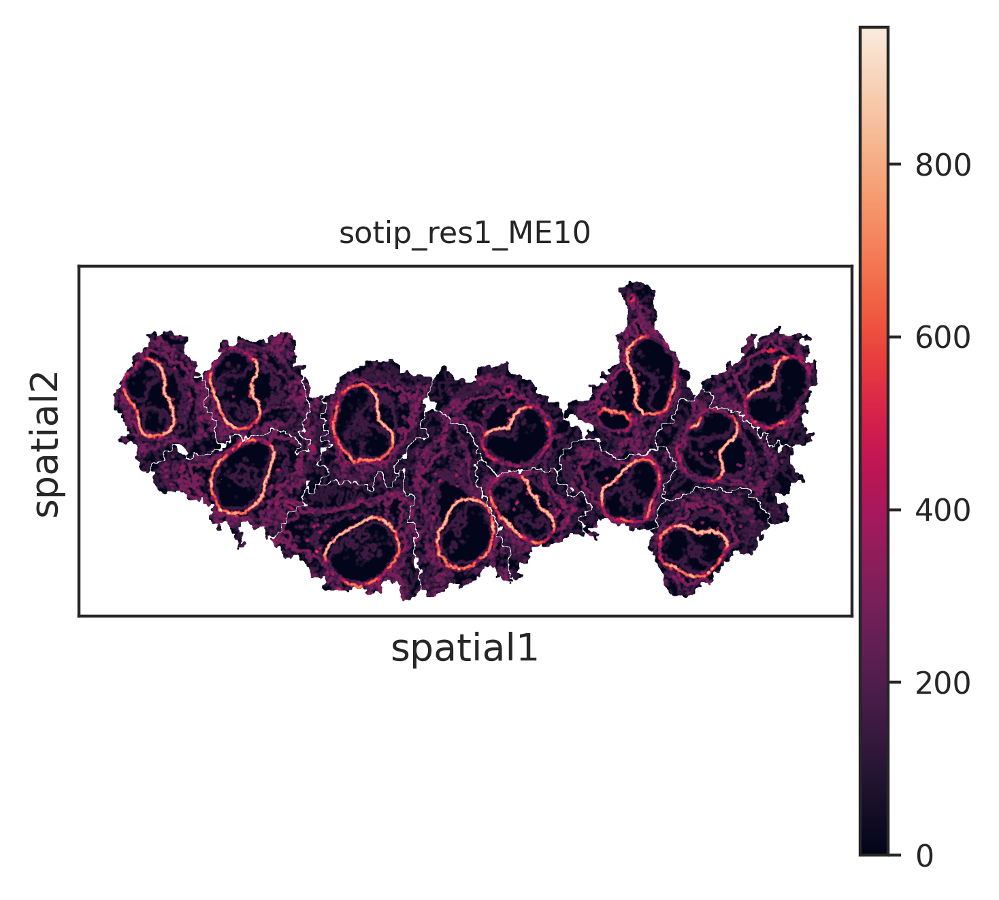

In [17]:
sc.pl.embedding(adata,basis='spatial',color=[heter_key],show=False,size=1,marker='.',title='sotip_res1_ME10')
plt.gca().set_aspect('equal', adjustable='box') 


# count cls

In [20]:
def heter_count_cls(adata):
    from toolz import compose
    cls_count = np.apply_along_axis(compose(len, np.unique), 1, adata.obsm['ME'])
    adata.obs['heter_nct'] = cls_count

In [21]:
from toolz import compose
cls_count = np.apply_along_axis(compose(len, np.unique), 1, adata.obsm['ME'])
gd_method = 'clsCount'
heter_key = 'ME_heter_{0}_{1}'.format(cls_key,gd_method)
adata.obs[heter_key] = cls_count

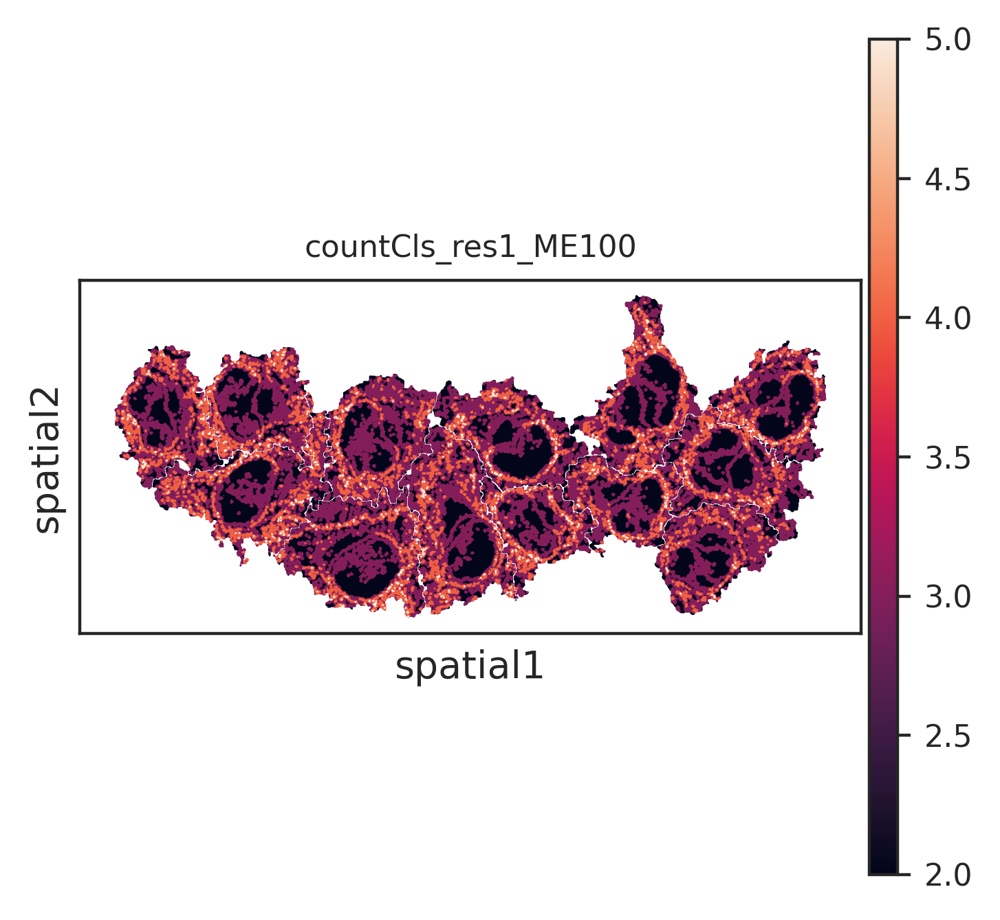

In [22]:
sc.pl.embedding(adata,basis='spatial',color=[heter_key],show=False,size=1,marker='.',title='countCls_res1_ME100')
plt.gca().set_aspect('equal', adjustable='box') 


In [33]:
adata

AnnData object with n_obs × n_vars = 270876 × 43
    obs: 'x', 'y', 'is_nucleous', 'is_cytplasm', 'cell_id', 'leiden', 'cluster', 'ME_heter_cluster_uniform', 'ME_heter_cluster_paga_guided_umap', 'sotip_heter_log', 'ME_heter_cluster_clsCount'
    uns: 'cluster_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'is_nucleous_colors', 'is_cytplasm_colors', 'MEidx', 'GD', 'paga', 'cluster_sizes'
    obsm: 'X_pca', 'X_umap', 'spatial', 'ME'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [26]:
adata.obs['cell_id']

908860    140
682735    118
806699    136
790375    127
835641    142
         ... 
961485    143
806705    136
603424    118
839951    136
768582    136
Name: cell_id, Length: 270876, dtype: category
Categories (13, object): ['118', '119', '120', '122', ..., '141', '142', '143', '146']

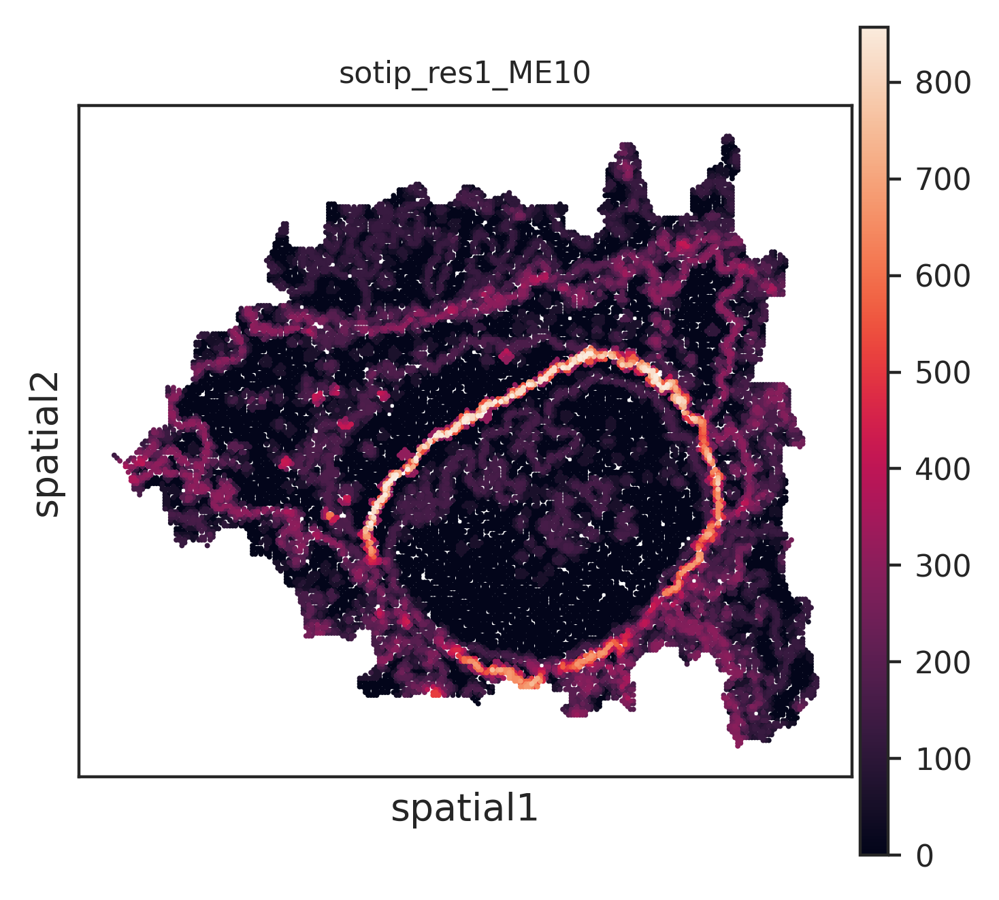

In [52]:
adata_use = adata[adata.obs['cell_id']=='118']
sc.pl.embedding(adata_use,basis='spatial',
                color=['ME_heter_cluster_paga_guided_umap'],
                # color=['ME_heter_cluster_paga_guided_umap'],
                
                show=False,size=8,marker='.',title='sotip_res1_ME10')
plt.gca().set_aspect('equal', adjustable='box') 
